In [7]:
import numba
import numpy as np
import math


class base:
    """Base class doesn't do anything but setup interface"""
    def __init__(self):
        pass;
    def apply(self,inA):
        """Apply clip on array 
        
        array - Numpy input array
        """
        raise Exception("Must override apply function")

class basicClip(base):
    def __init__(self ,clip=None,bclip=None,eclip=None):
        """
            clip - Apply -clip and clip
            bclip - Apply minimum value clip
            eclip - Apply maximum value clip
        """
        if not clip and not bclip and not eclip:
            raise Exception("must specify bclip, eclip or clip")
        
        if eclip:
            self._eclip=eclip
            if bclip:
                self._bclip=bclip
            elif clip:
                self._bclip=-clip
            else:
                self._bclip=None
        else:
            if clip:
                self._eclip=clip
                if bclip:
                    self._bclip=bclip
                else:
                    self._bclip=-clip
            else:
                self.eclip=None
                if bclip:
                    self._bclip=bclip
    def apply(self,array):
        """Apply clip to array
        
            array - Input array
        
        """
        return np.clip(array,a_min=self._bclip,a_max=self._eclip)

class percentileClip(basicClip):
    """Clip data based on percentiles"""
    
    def __init__(self,array,bpclip=1,epclip=99):
        """
            array to base clip on
            bpclip - Low clip
            epclip - High clip
        """
        self._bclip=None
        self._eclip=None
        if bpclip:
            self._bclip=np.percentile(array,bpclip)
        if epclip:
            self._eclip=np.percentile(array,epclip)
        super().__init__(self,bclip=self._bclip,eclip=self._eclip)
            
            
@numba.njit()
def sumE(array,hw):
    tmp=np.zeros(array.shape[0]+hw*2)
    out=array.copy()
    tmp[0:hw]=array[0]
    tmp[hw:hw+array.shape[0]]=array[:]
    tmp[array.shape[0]+hw]=array[array.shape[0]-1]
    out[0]=np.sum(tmp[0:2*hw+1])
    for i in range(1,out.shape[0]):
        out[i]=out[i-1]-tmp[i-1]+tmp[2*hw+i]
    return out


@numba.njit(parallel=True)
def calcL1_1D(array,wind):
    out=array.copy()
    hwind=int(wind[0])
    for i2 in numba.prange(array.shape[0]):
        x=array[i2,:]
        y=sumE(x,hwind)
        out[i2,:]=y
    return out

@numba.njit(parallel=True)
def calcL1_2D(array,wind):
    out=array.copy()
    hw1=int(wind[0])
    hw2=int(wind[1])
    for i3 in numba.prange(array.shape[0]):
        tmp=np.zeros((out.shape[1],out.shape[0]),np.float32)
        for i2 in range(out.shape[1]):
            tmp[i2,:]=sumE(array[i3,i2,:],hw1)
        for i1 in range(out.shape[0]):
            out[i3,:,i1]=sumE(array[i3,:,i1],hw2)
    return out
            
            
     
     
@numba.njit(parallel=True)
def calcL1_3D(array,wind):
    out=array.copy()
    hw1=int(wind[0])
    hw2=int(wind[1])
    hw3=int(wind[2])
    for i4 in numba.prange(array.shape[0]):
        tmp=np.zeros(out.shape[1],out.shape[2],out.shape[3])
        tmp2=tmp.copy()
        for i3 in range(out.shape[1]):
            for i2 in range(out.shape[2]):
                tmp[i3,i2,:]=sumE(array[i4,i3,i2,:],hw1)
        for i3 in range(out.shape[1]):
            for i1 in range(out.shape[2]):
                  tmp2[i3,:,i1]=sumE(tmp[i3,:,i1],hw2)
        for i2 in range(out.shape[2]):
            for i1 in range(out.shape[3]):
                  out[i4,:,i2,i1]=sumE(tmp2[:,i2,i1],hw3)
    return out
                  
@numba.njit(parallel=True)
def applyAGC(inA,wt,sm,nsm):
    out=inA.copy()
    sm=wt.max()/nsm/128
    print(wt.min(),wt.max(),wt[20],sm)
    for i in numba.prange(inA.shape[0]):
        out[i]=inA[i]/(wt[i]/nsm+sm)
    return out
   
        
        

In [8]:
class agc(base):
    
    def __init__(self,wind:list=[100]):
        if len(wind)>3:
            raise Exception("Expecting wind to be an int array of len<=3")
        self._wind=numba.typed.List()
        self._nsm=1
        for w in wind: 
            self._wind.append(w)
            self._nsm*=w
    def apply(self,array):
        """
        Apply AGC on given dataset
        
        """
        absA=np.absolute(array)
        perc=4
        found=False
        while not found and perc<80:
            val=np.percentile(absA,perc)
            if val==0:
                perc*=2
            else:
                found=True
        if not found:
            return out
        else:
            if len(array.shape)==1:
                if len(self._wind)>1:
                    raise Exception("Can not have window higher dimension than data")
                oneD=calcL1_1D(np.reshape(absA,(array.shape[0],1),self._wind))
            elif len(array.shape)==2:
                if len(self._wind)==1:
                    oneD=calcL1_1D(absA,self._wind)
                elif len(self._wind)==2:
                    oneD=caclcL1_2D(np.reshape(absA,(array.shape[0],array.shape[1],1)),self._wind)
                else:
                    raise Exception("wind must be 1-D or 2-D when array is 2-D")
            elif len(array.shape)==3:
                if len(self._wind)==1:
                    oneD=caclcL1_1D(np.reshape(absA,(array.shape[0],array.shape[1]*array.shape[1])),wind)
                elif len(self._wind)==2:
                    oneD=calcL1_2D(array,wind)
                else:
                    oneD=calcL1_3D(np.reshape(absA,(array.shape[0],array.shape[1],array.shape[2],1)),wind)
            else:
                n=list(array.shape)
                if len(self._wind)==1:
                    oneD=calcL1_1D(np.reshape(absA,(n[0],math.product(n[1:]))),wind)
                elif len(self._wind)==2:
                    oneD=calcL1_2D(np.reshape(absA,(n[0],n[1],math.product(n[2:]))),wind)
                else:
                    oneD=calcL1_3D(np.reshape(absA,(n[0],n[1],n[2],product(n[3:]))),wind)
        #return np.reshape(oneD,array.shape)
        return np.reshape(applyAGC(np.reshape(array,(array.size,)),\
                                   np.reshape(oneD,(oneD.size,)),val,self._nsm),\
                          array.shape)
        
            
        

In [9]:
#@numba.jit(nopython=True)
def softClipBasic(array,g):
    """Soft clip data (Claerbout-softclip)
      array - array to softclip
      g - softclip parameter
    """
    print(type(array),type(g),g)
    n=array.size
    out=array.copy()
    for i in range(n):
        out[i]=array[i]*g/math.sqrt(1+g*g*array[i]*array[i])
    return out


class softClip(base):
    
    def __init__(self,perc:float=75,fact:float=math.sqrt(1./3.)):
        """SOft clip an array
            perc - Percentile to scale soft clip by
            fact - Factor to apply to the percentil
        """
        self._perc=perc
        self._fact=fact
                 
                 
    def apply(self,array):
        """
        Apply softclip on given dataset
        
        """
        return np.reshape(softClipBasic(np.reshape(array,(array.size,)),self._fact/np.percentile(array,self._perc)),array.shape)

In [10]:
import genericIO
io=genericIO.defaultIO
vec=io.getVector("test.H")
vecN=vec.getNdArray()

WARNING! DATAPATH not found. The folder /tmp will be used to write binary files


In [11]:
cp=softClip()
vec2=cp.apply(vecN)
print(vec2.shape,vec2.min(),vec2.max(),np.unravel_index(np.argmin(vec2),vec2.shape),\
      np.unravel_index(np.argmax(vec2),vec2.shape))

<class 'numpy.ndarray'> <class 'numpy.float64'> 0.0004678618334614687
(1000, 1500) -0.9987119 0.9996808 (540, 283) (531, 267)


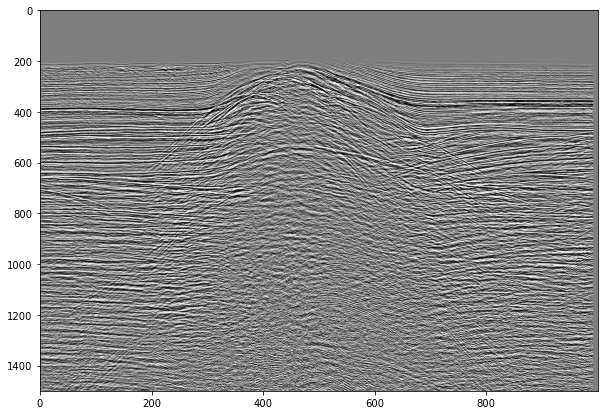

In [12]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(10,7)
plt.imshow(np.transpose(vec2),cmap="gray",aspect="auto")

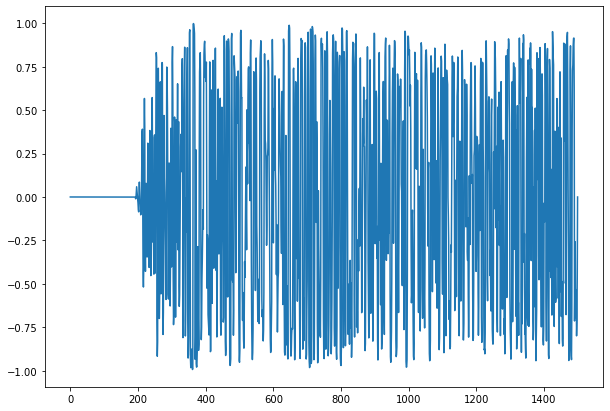

In [13]:
plt.plot(vec2[900,:])

In [14]:
plt.plot(vec[900,:])

TypeError: 'floatVector' object is not subscriptable

In [15]:
import holoviews as hv
class plot:
    def __init__(self,vec,**kw):
        """
        vec - Sepvector
        styleOpts- Dictionary 
        plotOpts - Dictionary
        Additional options to backend (help(holoviews.Image))

        axiswise - Plots should share same clip,color, etc [True]
        transp- Transpose data (True)
        bclip,eclip - Clip values
        bpclip[1],epclip[99] - Clip percentiles (if bclip,eclip not set)
        pclip - Clip percentile [98] (if bpclip,epclip not set)
        Defaults:
            yreverse =True
            cmap="gist_gray" """        
        self._axes=vec.getHyper().axes
        self._opts=kw
        mn1=self._axes[1].o
        if not "invert_yaxis" in self._opts:
            self._opts["invert_yaxis"]=True 
        if not "invert_xaxis" in self._opts:
            self._opts["invert_xaxis"]=False
        if not "transp" in self._opts:
            self._opts["transp"]=True

        if not "label1" in self._opts:
            self._opts["label1"]=self._axes[0].label
        if not "label2" in self._opts:
            self._opts["label2"] =self._axes[1].label

        if self._opts["transp"]:
            art=np.transpose(vec.getNdArray())
            self._mx2=self._axes[1].o+self._axes[1].d*self._axes[1].n
            self._mx1=self._axes[0].o+self._axes[0].d*self._axes[0].n
            self._mn1=self._axes[0].o
            self._mn2=self._axes[1].o
            if not "xlabel" in self._opts:
                self._opts["xlabel"]=self._opts["label2"]
            if not "ylabel" in self._opts:
                self._opts["ylabel"]=self._opts["label1"]  
        else:
            art=vec.getNdArray()
            self._mn2=self._axes[0].o
            self._mx2=self._axes[0].o+self._axes[0].d*self._axes[0].n
            self._mx1=self._axes[1].o+self._axes[1].d*self._axes[1].n
            self._mn1=self._axes[1].o
            if not "xlabel" in self._opts:
                self._opts["xlabel"]=self._opts["label1"]
            if not "ylabel" in self._opts:
                self._opts["ylabel"]=self._opts["label2"] 
        
        if  not  self._opts["invert_yaxis"]:
            if self._opts["invert_xaxis"]:
                self._ar=np.flip(art,(0,1))
            else:
                self._ar=np.flip(art,(0))
        elif self._opts["invert_xaxis"]:
            self._ar=np.flip(art,1)
        else:
            self._ar=np.flip(art,0)
        self._bClip=None
        self._eClip=None
        myList=["bclip","eclip","clip","pclip","bpclip","epclip","label1","label2","transp"]
        if  "bclip" in self._opts:
            self._bClip=float(self._opts["bclip"])
        if "axiswise" not in self._opts:
            self._opts["axiswise"]=True
        if "eclip" in self._opts:
            self._eClip=float(self._opts["eclip"])
        if self._bClip==None and "bpclip" in self._opts:
            self._bClip=np.percentile(self._ar,float(self._opts["bpclip"]))
        elif self._bClip==None and "eclip" in self._opts:
            self._bClip=np.percentile(self._ar,0.)
        if self._eClip==None and "epclip" in self._opts:
            self._eClip=np.percentile(self._ar,float(self._opts["epclip"]))
        elif self._eClip==None and "bclip" in self._opts:
            self._eClip=np.percentile(self._ar,100.)
        elif self._eClip==None and self._bClip==None:
            ar2=np.absolute(self._ar)
            self._pclip=98
            if "pclip" in self._opts:
                self._pclip=self._opts["pclip"]
            self._eClip=np.percentile(ar2,self._pclip)
            self._bClip=-self._eClip
        for k in myList:
            if k in self._opts:
                del self._opts[k]
        if not "cmap" in self._opts:
            self._opts["cmap"]="gist_gray"
        self._img=hv.Image(self._ar,vdims=hv.Dimension("z",range=(self._bClip,self._eClip)),\
        bounds=[self._mn2,self._mn1,self._mx2,self._mx1]).opts(**self._opts)
    def image(self):
        """Return image"""
        return self._img

    def getClips(self):
        return self._bClip,self._eClip


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
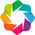

:Image   [x,y]   (z)

In [29]:
hv.extension("bokeh")
def hook(plot, element):
    """Set the image renderer to happen under the grid lines"""
    plot.handles['glyph_renderer'].level = 'image'

plot(vec,width=800,height=400,show_grid=True,fontscale=1.2,colorbar=True,clabel="SSSS",title="TESTME",hooks=[hook]).image()


In [ ]:
import numba
@numba.njit()
def getIndexMap()

In [3]:
from numba.typed import List
class position:
    """Position object"""

    def __init__(self,initFrom):
        """
            Initiaize position object with
            Option 1 - hypercube
        """
        self._hyper = initFrom
        self._n=List()
        self._b=List()
        self._e=List()
        self._pos=List()
        for i in range(8):
            self._n.append(1)
            self._b.append(0)
            self._e.append(1)
            self._pos.append(0)
        self.nAxMax = 0
        if isinstance(initFrom, Hypercube.hypercube):
            self.initFromHyper(initFrom)
        else:
            raise Exception("Only support hypercube initialization")

    def initFromHyper(self, hyp):
        """Initialize from a hypercube"""
        for i in range(len(self._hyper.axes)):
            self._n[i] = self._hyper.axes[i].n
            self._e[i] = self._n[i]
            self._pos[i] = int(self._n[i] / 2)
            if self._n[i] > 1:
                self.nAxMax = i

    def advance(self, iax, step):
        """Advance a frame looping around if necessary
            iax - Axis
            step - Step
        """
        if abs(step) >= self._n[iax]:
            step = step / abs(step) * (self._n[iax] - 1)

        self._pos[iax] += step
        if self._pos[iax] >= self._n[iax]:
            self._pos[iax] -= self._n[iax]
        elif self._pos[iax] < 0:
            self._pos[iax] += self._n[iax]

    def setPosition(self, iax, ipos):
        """Set the position along one axis"""
        if ipos < 0:
            raise Exception("Illegal set position value < 0")
        if ipos >= self._n[iax]:
            raise Exception("Illegal set position greater >= n")
        if ipos < self._b[iax] or ipos >= self._e[iax]:
            self.resetAxis(iax)
        self._pos[iax] = int(ipos)

    def resetAxis(self, iax):
        """Reset axis to default"""
        self._b[iax] = 0
        self._e[iax] = self._n[iax]
        self._e[iax] / 2

    def resetAllAxes(self):
        """Reset all axes"""
        for i in range(8):
            self.resetAxis(i)

    def getPosition(self):
        """Return position"""
        return self._pos
    def setWindow(self, iax, b, e):
        """ Set the window for the axis
            iax - Axis to change
            b - First sample
            e - Last sample"""
        self._b[iax] = max(0, int(b + .5))
        self._e[iax] = min(int(e + .5), self._n[iax])
        if self._e[iax] == self._b[iax]:
            if self._e[iax] < self._n[iax]:
                self._e[iax] = self._b[iax] + 1
            else:
                self._b[iax] = self._e[iax] - 1

        self._pos[iax] = int((b + e) / 2)





In [17]:
include Hypercube




class Dataset:
    """Basic dataset class"""
    def __init__(self):
        pass;
    def getSlice(self,pos:position, iax1:int,iax2:int,b1:int,e1:int,b2:int,e2:int):
        """Return slice"""
        raise Exception("Must override getSlice")

class inCoreDataset(Dataset):
    """Basic class for a n incore dataset"""
    
    def __init__(self,dat,hyper):
        """Initialize an incore dataset
        
            dat - Incore dataset (numpy)
            hyper - Hypercube describing data
            
        """
        
        self._hyper=hyper
        self._ns=self._hyper.getNs()
        self._dat=dat
        
    def getSlice(self,pos:position,iax1:int,iax2:int,b1:int,e1:int,b2:int,e2:int):
        
        if self.
    

Image

Online example: http://holoviews.org/reference/elements/bokeh/Image.html

-------------
Style Options
-------------

	alpha, cmap, muted, visible

(Consult bokeh's documentation for more information.)

------------
Plot Options
------------

The plot options are the parameters of the plotting class:

Parameters of 'RasterPlot'

Parameters changed from their default values are marked in red.
Soft bound values are marked in cyan.
C/V= Constant/Variable, RO/RW = ReadOnly/ReadWrite, AN=Allow None

Name                                 Value                         Type         Bounds     Mode  

fontsize                       {'title': '12pt'}                Parameter                V RW AN 
fontscale                             None                        Number                 V RW AN 
show_title                            True                       Boolean        (0, 1)     V RW  
title                    '{label} {group} {dimensions}'           String                   V RW  
tit

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
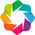

Column
    [0] HoloViews(HoloMap)
    [1] Column
        [0] WidgetBox
            [0] DiscreteSlider(margin=(20, 20, 5, 20), name='Carrier frequency', options=OrderedDict([('20', ...]), value=40, width=250)
            [1] DiscreteSlider(margin=(5, 20, 20, 20), name='Modulation frequency', options=OrderedDict([('20', ...]), value=60, width=250)
        [1] VSpacer()

In [36]:
import numpy as np
import holoviews as hv
import panel as pn
from holoviews import opts

hv.extension('bokeh')

opts.defaults(opts.Curve(line_width=1))

# Create dummy data
def fm_modulation(f_carrier=220, f_mod=220, mod_index=1, length=0.1, sampleRate=2000):
    sampleInc = 1.0/sampleRate
    x = np.arange(0,length, sampleInc)
    y = np.sin(2*np.pi*f_carrier*x + mod_index*np.sin(2*np.pi*f_mod*x))
    return hv.Curve((x, y), 'Time', 'Amplitude')

f_carrier = np.linspace(20, 60, 3)
f_mod = np.linspace(20, 100, 5)

curve_dict = {(fc, fm): fm_modulation(fc, fm) for fc in f_carrier for fm in f_mod}

kdims = [hv.Dimension(('f_carrier', 'Carrier frequency'), default=40),
         hv.Dimension(('f_mod', 'Modulation frequency'), default=60)]
holomap = hv.HoloMap(curve_dict, kdims=kdims)

# At this point you can just plot the holomap to get the widgets to the right of the plot

# Convert the holomap into a panel
holomap_panel = pn.panel(holomap)

# You can inspect this object to see that it can be accessed by index, where the object at index 0 is the plot while the object at index 1 is the widget panel

plot = holomap_panel[0]
widgets = holomap_panel[1]

# Create a new layout in any way you want, for example in a column with the widgets below the plot
new_layout_panel = pn.Column(plot, widgets)

# Visualize
new_layout_panel.servable()

# You can even see that the widgets object can be split up into the two range sliders, and you could split those up and position in any way you want as well using Panel



In [4]:
import numpy as np
import holoviews as hv
from holoviews.streams import Stream, param

ls = np.linspace(0, 10, 200)
xx, yy = np.meshgrid(ls, ls)

XY = Stream.define('XY',x=0.0,y=0.0)

def marker(x,y):
    return hv.VLine(x) * hv.HLine(y)

image = hv.Image(np.sin(xx)*np.cos(yy))

dmap = hv.DynamicMap(marker, streams=[XY()])

image * dmap


:DynamicMap   []

In [5]:
image

:Image   [x,y]   (z)